In [1]:
import cv2
import numpy as np
import layoutparser as lp
import matplotlib.pyplot as plt
from PIL import Image

## Functions

In [2]:
def resize_and_show_image(image_path, percentage=None, show_image=True, return_as_numpy=False):
    """
    Resize an image, optionally show it, and return it as a NumPy array.

    Parameters:
    - image_path: str, path to the image file.
    - percentage: float, percentage by which to resize the image (0 to 100).
    - show_image: bool, whether to display the image using matplotlib.
    - return_as_numpy: bool, whether to return the image as a NumPy array.

    Returns:
    - If return_as_numpy is True, returns the image as a NumPy array.
    - Otherwise, returns None.
    """
    # Open the image
    image = Image.open(image_path)

    # Resize the image based on percentage
    if percentage is not None:
        if not 0 < percentage <= 100:
            raise ValueError("Percentage should be between 0 and 100.")
        width, height = image.size
        new_width = int((percentage / 100) * width)
        new_height = int((percentage / 100) * height)
        new_size = (new_width, new_height)
        resized_image = image.resize(new_size)
    else:
        resized_image = image

    # Show the image if requested
    if show_image:
        dpi=300
        plt.figure(figsize=(new_width/dpi, new_height/dpi), dpi=dpi)
        plt.imshow(resized_image)
        plt.axis('off')  # Turn off axis labels
        plt.show()

    # Return the image as a NumPy array if requested
    if return_as_numpy:
        image_array = np.array(image)
        return image_array

    return None

In [3]:
image_path = "data/jpg/december_1994/PM_News_December_1_1994_Pg_2.jpeg"

image_np = resize_and_show_image(image_path, percentage=100, show_image=False, return_as_numpy=True)

## [Official Tutorial: Use Layout Models to detect complex layout](https://layout-parser.readthedocs.io/en/latest/example/deep_layout_parsing/index.html)

In [4]:
import layoutparser as lp
import cv2

In [5]:
IMAGE_PATH = "data/jpg/december_1994/PM_News_December_1_1994_Pg_2.jpeg"

In [6]:
image = cv2.imread(IMAGE_PATH)
image = image[..., ::-1]

In [7]:
dt_model = lp.Detectron2LayoutModel('lp://PubLayNet/faster_rcnn_R_50_FPN_3x/config',
                                 extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8],
                                 label_map={0: "Text", 1: "Title", 2: "List", 3:"Table", 4:"Figure"})
ocr_agent = lp.TesseractAgent(languages='eng')


The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


/home/ubuntu/lp-parser/layout-parser-env/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


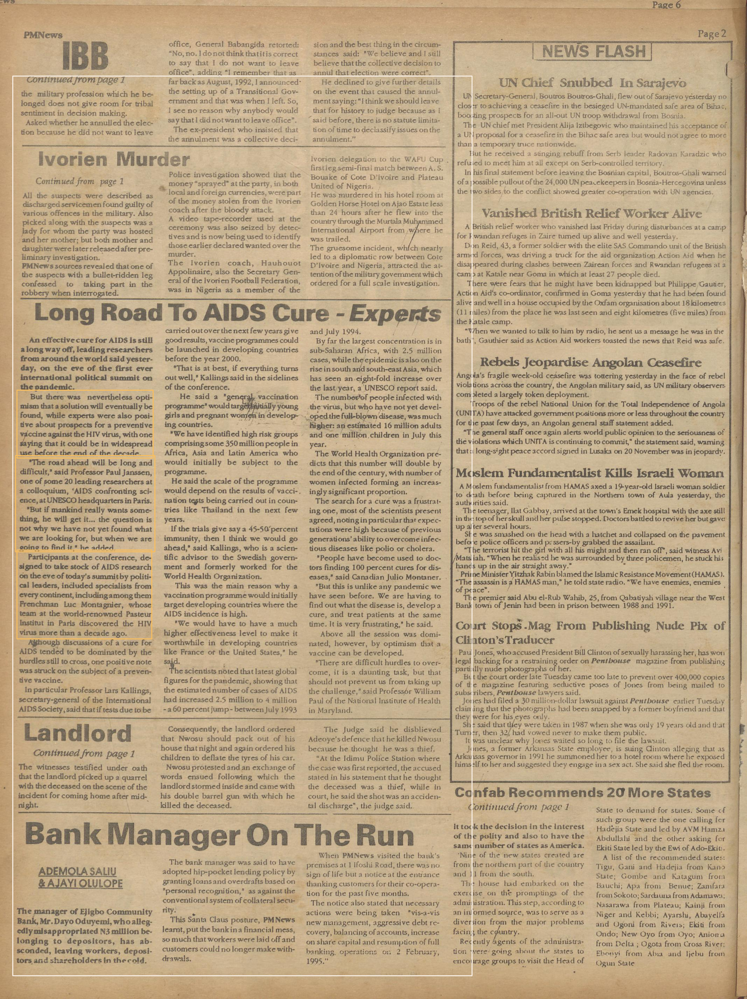

In [8]:
layout = dt_model.detect(image)
lp.draw_box(image, layout, box_width=3)

### Check Results from model

In [9]:
def get_text_blocks(layout):
    text_blocks = lp.Layout([b for b in layout if b.type=='Text'])
    figure_blocks = lp.Layout([b for b in layout if b.type=='Figure'])
    # there could be text in figure blocks. get text not in figure blocks
    text_blocks = lp.Layout([b for b in text_blocks \
                    if not any(b.is_in(b_fig) for b_fig in figure_blocks)])
    
    h, w = image.shape[:2]

    left_interval = lp.Interval(0, w/2*1.05, axis='x').put_on_canvas(image)

    left_blocks = text_blocks.filter_by(left_interval, center=True)
    left_blocks.sort(key = lambda b:b.coordinates[1])

    right_blocks = [b for b in text_blocks if b not in left_blocks]
    right_blocks.sort(key = lambda b:b.coordinates[1])

    # And finally combine the two list and add the index
    # according to the order
    text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(left_blocks + right_blocks)])

    return text_blocks


def get_ocr_text(text_blocks):
    for block in text_blocks:
        segment_image = (block
                        .pad(left=5, right=5, top=5, bottom=5)
                        .crop_image(image))
            # add padding in each image segment can help
            # improve robustness

        text = ocr_agent.detect(segment_image)
        block.set(text=text, inplace=True)

    text_blocks_texts = text_blocks.get_texts()

    return text_blocks_texts


In [10]:
text_blocks = get_text_blocks(layout)
text_blocks_texts = get_ocr_text(text_blocks)

In [11]:
INDEX=0
print(text_blocks_texts[INDEX], end='\n---\n')

eee i ere a
But there-was nevertheless opti-
mism that a solution will eventually be
found, while experts were also posi-
tive about prospects for a preventive
iccine against the HIV virus, with one
ying that it could be in widespread
_ use before the end of the decade.

---


## Additional from Youtube

In [14]:
lp.draw_text(image, ocr_text, with_box_on_text=True,
                 show_element_type=True, show_element_id=True, box_width=4)

NameError: name 'ocr_text' is not defined